# Computer Vision Project
#### Introduction to Machine learning course | Instructor: Dr. Fatemeh Mirsalehi

<font color='cyan'> Responsible TA: Amirhossein Razlighi </font>

In [1]:
%pip install torch torchvision numpy matplotlib Pillow

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt

## Section 1: Implementing a CNN from scratch! (30 points)

### 1.1 - Forward and Backward (20/30 pts)

__CNN__ s are powerfull tools to work with in the scope of _Computer Vision_. You have seen MLPs before and know how to do forward and backward pass on them. In this part, we want to create a convolutional layer (a simple one, of course!) just to understand well that how a Convolutional Layer works, behind the scenes. Then, we can simply use PyTorch's `Conv2D` layer for the rest of this project, because we understood that how Convolutions work, behind the scene!

__FORWARD PASS__:

In forward pass, you should apply the convolution operation on the input image. The convolution operation is as follows:

$$
\text{output}[i, j] = \sum_{k=0}^{K-1} \sum_{l=0}^{L-1} \text{input}[i+k, j+l] \times \text{kernel}[k, l]
$$

You can see a sample convolution operation (with a $3 \times 3$ kernel) in the following image:
<div style="text-align:center;">
  <img src="./Images/Conv.gif" />
</div>

Please note that, these are samples for you to understand the operation better. For _forward pass_ that you should implement, please notice that you should convolve the kernel along all $C$ channels of the input image. So, the output shape should be $(N, H_{out}, W_{out})$. These values are calculated as follows:

$$
H_{out} = \frac{H_{in} + 2 \times \text{padding}}{\text{stride} - HH} + 1
$$
$$
W_{out} = \frac{W_{in} + 2 \times \text{padding}}{\text{stride} - WW} + 1
$$


where $HH$ and $WW$ are the height and width of the kernel, respectively. __stride__ is the step size of the kernel, and __padding__ is the number of zeros that should be padded to the input image. Please also note that $b$ stands for bias, which is a scalar value that should be added to the output of the convolution operation. (for each kernel)

You can see a more detailed example, below:

<div style="text-align:center;">
  <img src="./Images/conv3.gif" />
</div>

__Backward Pass__:

In backward pass, you should calculate gradient of output with respect to the input image and the kernel. These gradients will be used in _optimization_ to update kernel weights. (You saw something similar, in using MLPs with gradient descent algorithm!). So, we need $d_x$, $d_w$ and $d_b$ in the backward pass. These are calculated as follows:

$$
dx_{padded} [n, :, i * stride: i * stride + HH, j * stride: j * stride + WW] += w[f] \times dout[n, f, i, j]
$$

$$
dw_{f} = \sum_{n=0}^{N - 1} \sum_{i=0}^{H_{out} - 1} \sum_{j=0}^{W_{out} - 1} x_{padded}[n, :, i * stride: i * stride + HH, j * stride: j * stride + WW] \times dout[n, f, i, j]  
$$

$$
db_{f} = \sum_{n=0}^{N - 1} \sum_{i=0}^{H_{out} - 1} \sum_{j=0}^{W_{out} - 1} dout[n, f, i, j]
$$

For better understanding of the backward pass, you can see the following image:

<div style="text-align:center;">
  <img src="./Images/backprop_cs231n.png" />
</div>


In [3]:
import numpy as np


class MyConv:
    def __init__(self, stride, padding):
        self.stride = stride
        self.padding = padding

    def forward(self, x, w, b):
        out = None

        ####### TO DO : Implement Forward pass of Conv2D #######
        ########################################################

        N, C, H, W = x.shape
        F, _, HH, WW = w.shape
        pad = self.padding
        stride = self.stride
        H_out = (H + 2 * pad - HH) // stride + 1
        W_out = (W + 2 * pad - WW) // stride + 1

        x_pad = np.pad(x, ((0, 0), (0, 0), (pad, pad), (pad, pad)), mode='constant', constant_values=0)

        out = np.zeros((N, F, H_out, W_out))

        for n in range(N):
            for f in range(F):
                for i in range(H_out):
                    for j in range(W_out):
                        h_start = i * stride
                        h_end = h_start + HH
                        w_start = j * stride
                        w_end = w_start + WW
                        out[n, f, i, j] = np.sum(x_pad[n, :, h_start:h_end, w_start:w_end] * w[f, :, :, :]) + b[f]



        ####### TO DO : End #######
        #############################

        cache = (x, w, b, x_pad, H_out, W_out)
        self.cache = cache
        return out

    def backward(self, dout):
        dx, dw, db = None, None, None

        x, w, b, x_padded = None, None, None, None

        ####### TO DO : Implement backward pass #######
        ###############################################

        x, w, b, x_padded, H_out, W_out = self.cache
        N, C, H, W = x.shape
        F, _, HH, WW = w.shape

        dw = np.zeros_like(w)
        dx = np.zeros_like(x)
        db = np.zeros_like(b)

        dx_padded = np.zeros_like(x_padded)

        for n in range(N):
            for f in range(F):
                for i in range(H_out):
                    for j in range(W_out):
                        h_start = i * self.stride
                        h_end = h_start + HH
                        w_start = j * self.stride
                        w_end = w_start + WW

                        dw[f] += x_padded[n, :, h_start:h_end, w_start:w_end] * dout[n, f, i, j]
                        dx_padded[n, :, h_start:h_end, w_start:w_end] += w[f] * dout[n, f, i, j]
                        db[f] += dout[n, f, i, j]

        if self.padding > 0:
            dx = dx_padded[:, :, self.padding:-self.padding, self.padding:-self.padding]
        else:
            dx = dx_padded

        ####### TO DO : End #######
        #############################

        self.dx = dx
        self.dw = dw
        self.db = db
        return dx, dw, db

In [4]:
def rel_error(x, y):
  return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

In [5]:
# A simple test for forward pass (DO NOT CHANGE)

x_shape = (2, 3, 4, 4)
w_shape = (3, 3, 4, 4)
x = np.linspace(-0.1, 0.5, num=np.prod(x_shape)).reshape(x_shape)
w = np.linspace(-0.2, 0.3, num=np.prod(w_shape)).reshape(w_shape)
b = np.linspace(-0.1, 0.2, num=3)

out = MyConv(stride=2, padding=1).forward(x, w, b)
correct_out = np.array([[[[[-0.08759809, -0.10987781],
                           [-0.18387192, -0.2109216 ]],
                          [[ 0.21027089,  0.21661097],
                           [ 0.22847626,  0.23004637]],
                          [[ 0.50813986,  0.54309974],
                           [ 0.64082444,  0.67101435]]],
                         [[[-0.98053589, -1.03143541],
                           [-1.19128892, -1.24695841]],
                          [[ 0.69108355,  0.66880383],
                           [ 0.59480972,  0.56776003]],
                          [[ 2.36270298,  2.36904306],
                           [ 2.38090835,  2.38247847]]]]])

# The outputted difference which is printed, should be around 1e-8
print ('Testing conv_forward_naive')
print ('difference: ', rel_error(out, correct_out))

Testing conv_forward_naive
difference:  2.2121476417505994e-08


In [6]:
def eval_numerical_gradient_array(f, x, df, h=1e-5):
  grad = np.zeros_like(x)
  it = np.nditer(x, flags=['multi_index'], op_flags=['readwrite'])
  while not it.finished:
    ix = it.multi_index

    oldval = x[ix]
    x[ix] = oldval + h
    pos = f(x).copy()
    x[ix] = oldval - h
    neg = f(x).copy()
    x[ix] = oldval

    grad[ix] = np.sum((pos - neg) * df) / (2 * h)
    it.iternext()
  return grad

In [7]:
# A simple test for backward pass (DO NOT CHANGE)

x = np.random.randn(4, 3, 5, 5)
w = np.random.randn(2, 3, 3, 3)
b = np.random.randn(
    2,
)
dout = np.random.randn(4, 2, 5, 5)
conv = MyConv(stride=1, padding=1)

dx_num = eval_numerical_gradient_array(
    lambda x: conv.forward(x, w, b), x, dout
)
dw_num = eval_numerical_gradient_array(
    lambda w: conv.forward(x, w, b), w, dout
)
db_num = eval_numerical_gradient_array(
    lambda b: conv.forward(x, w, b), b, dout
)

out = conv.forward(x, w, b)
dx, dw, db = conv.backward(dout)

# Your printed errors should be around 1e-9
print("Testing conv_backward_naive function")
print("dx error: ", rel_error(dx, dx_num))
print("dw error: ", rel_error(dw, dw_num))
print("db error: ", rel_error(db, db_num))

Testing conv_backward_naive function
dx error:  8.995056819820216e-09
dw error:  2.8984760827947274e-10
db error:  7.53274157867817e-11


### 1.2 - Visualizing Convolution results (10/30 pts)

In this part, we try to visualize the results of the convolution operation. We will 2 sample photos (in `Images/Sample`) and then we will use our `MyConv` class to apply some cool convolutions (and see their result on an image).

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [9]:
path = '/content/drive/MyDrive'

In [10]:
from PIL import Image

first_img, second_img = Image.open(f"{path}/Images/Sample/Sharif_1.JPG"), Image.open(
    f"{path}/Images/Sample/Sharif_2.jpg"
)
first_img = first_img.resize((256, 256))
second_img = second_img.resize((256, 256))

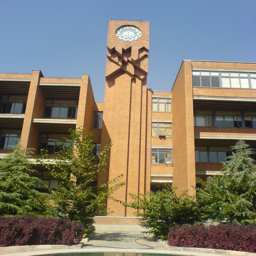

In [11]:
first_img

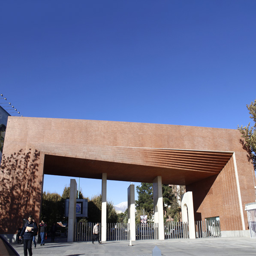

In [12]:
second_img

Convolutions have some interesting usages in image processing. For example, you can extract edges from an image by applying a convolution with a kernel that detects edges. Or you can convolve a specific kernel with your image to make it grayscale or blurred! Look at the definitions below:

__Edge Detection Kernel__:

_Sobel_ is one of the most famous edge detection kernels. It has two kernels, one for detecting vertical edges and the other for horizontal edges. You can see the kernels below:
$$
\text{Sobel}_x = \begin{bmatrix}
-1 & 0 & 1 \\
-2 & 0 & 2 \\
-1 & 0 & 1
\end{bmatrix}
$$

$$
\text{Sobel}_y = \begin{bmatrix}
-1 & -2 & -1 \\
0 & 0 & 0 \\
1 & 2 & 1
\end{bmatrix}
$$


__Grayscale Kernel__:

You can simply convolve the image with the following kernel to make it grayscale:

$$
\text{Grayscale\_across\_R} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.3 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

$$
\text{Grayscale\_across\_G} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.6 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

$$
\text{Grayscale\_across\_B} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.1 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

(Convolve each kernel with its corresponding channel)

__Blurring Kernel__:

One of the famous kernels to blur an image is _Gaussian Blur_. You can see the kernel below:

$$
\text{Gaussian\_Blur} = \frac{1}{16} \times \begin{bmatrix}
1 & 2 & 1 \\
2 & 4 & 2 \\
1 & 2 & 1
\end{bmatrix}
$$


In [13]:
sobelx = np.array([[-1, -2, -1],
                   [0, 0, 0],
                   [1, 2, 1]])

sobely = np.array([[-1, 0, 1],
                   [-2, 0, 2],
                   [-1, 0, 1]])

grayscale_r = np.array([[0, 0, 0],
                        [0, 0.3, 0],
                        [0, 0, 0]])

grayscale_g = np.array([[0, 0, 0],
                        [0, 0.6, 0],
                        [0, 0, 0]])

grayscale_b = np.array([[0, 0, 0],
                        [0, 0.1, 0],
                        [0, 0, 0]])

gaussian_blur = (1/16) * np.array([[1, 2, 1],
                                   [2, 4, 2],
                                   [1, 2, 1]])

In [14]:
img_size = 256

x = np.zeros((2, 3, img_size, img_size))
x[0] = np.array(first_img).transpose(2, 0, 1)
x[1] = np.array(second_img).transpose(2, 0, 1)

# a convolution weight, holding 4 filters 3x3
w = np.zeros((4, 3, 3, 3))
w[0, 0] = sobelx
w[1, 1] = sobely
w[2, 0] = grayscale_r
w[2, 1] = grayscale_g
w[2, 2] = grayscale_b
w[3] = gaussian_blur

b = np.array([0, 128, 128, 0])

conv = MyConv(stride=1, padding=1)
out = conv.forward(x, w, b)
print(out.shape)

(2, 4, 256, 256)


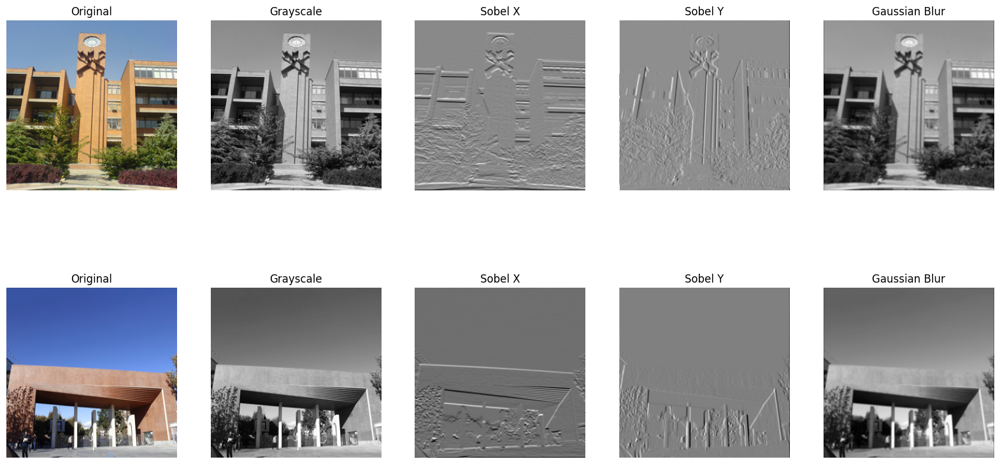

In [15]:
import matplotlib.pyplot as plt

#TODO: Plot the original image, grayscale, sobel x, sobel y, and gaussian blur of each image
def plot_images(original, processed, titles, filename=None):
    fig, axes = plt.subplots(2, 5, figsize=(20, 10))
    for i, ax in enumerate(axes.flatten()):
        ax.axis('off')
        if i % 5 == 0:
            ax.imshow(original[i // 5])
            ax.set_title('Original')
        else:
            ax.imshow(processed[i // 5, i % 5 - 1], cmap='gray')
            ax.set_title(titles[i % 5 - 1])
    if filename:
        plt.savefig(filename)
    plt.show()

titles = ['Grayscale', 'Sobel X', 'Sobel Y', 'Gaussian Blur']

grayscale_img = out[:, 2]
sobelx_img = out[:, 0]
sobely_img = out[:, 1]
gaussian_blur_img = out[:, 3]

processed_images = np.stack((grayscale_img, sobelx_img, sobely_img, gaussian_blur_img), axis=1)

plot_images([first_img, second_img], processed_images, titles)

Now that we understood how Convolution works, we proceed further to use it in our models to perform a desired and specific task! We can use PyTorch's `Conv2D` layer from now on, because we understood how Convolutions work, behind the scene!

## Section 2: Neural Style Transfer (90 points)

In this part, we are going to implement a famous technique in the field of _Computer Vision_ called __Neural Style Transfer__. This technique is used to apply the style of a specific image to another image. For example, you can apply the style of a famous painting to your photo! Let's get started!

### 2.1 - Importing Libraries

In [16]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
from torchvision.models import vgg19, VGG19_Weights

import copy

In [17]:
device = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "mps" if torch.backends.mps.is_available() else "cpu"
)
torch.set_default_device(device)
device

device(type='cuda')

### 2.2 - Loading Images and doing some Preprocessing (5/90 pts)

In this part, you should load the content and style images and preprocess them. Preprocessing includes resizing the images to a specific size, normalizing them, and converting them to PyTorch tensors. You can use `torchvision.transforms` to do these tasks.

In [18]:
img_size = 512 if not device == "cpu" else 256

#TODO: Implement some transformations for the images
transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    # transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [19]:
def load_image(img_path):
    image = Image.open(img_path).convert('RGB')
    image = transform(image).unsqueeze(0)
    return image.to(device, torch.float)

style_image = load_image(f"{path}/Images/Neural_Transfer/style.jpeg") # It's in Images/Neural_Transfer/Style.jpeg
content_image = load_image(f"{path}/Images/Neural_Transfer/Content.jpeg") # It's in Images/Neural_Transfer/Content.jpeg

style_image.size(), content_image.size()

(torch.Size([1, 3, 512, 512]), torch.Size([1, 3, 512, 512]))

Here, you should implement a helper function to show you images (which are now in form of pytorch tensors) in the notebook. You can use `torchvision.transforms.ToPILImage` to convert a tensor to a PIL image.

In [20]:
#TODO
def imshow(tensor, title=None):
    unloader = transforms.ToPILImage()
    image = tensor.cpu().clone()
    image = image.squeeze(0)
    image = unloader(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)

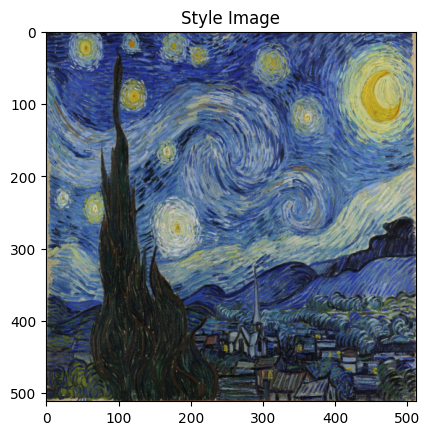

In [21]:
plt.figure()

imshow(style_image, "Style Image")

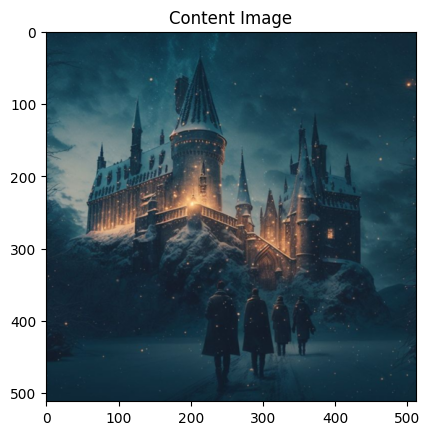

In [22]:
imshow(content_image, "Content Image")

### 2.2 - VGG19 Model (15/90 pts)

One of the important parts of Neural Style Transfer is to use a pre-trained model to extract features from the content and style images. Here, we are going to use a pre-trained VGG19 model to extract features from the images. You can use `torchvision.models.vgg19` to load the model. You should also freeze the weights of the model to prevent them from updating during the optimization process.

<div style="text-align:center;">
  <img src="./Images/VGG-19.png" />
</div>

But what is VGG model? Let's see with a simple experiment:

In [23]:
import certifi
import os

os.environ['SSL_CERT_FILE'] = certifi.where()

Here, please load `VGG19` model from `torchvision.models` and see the architecture of the model. You may need models `features` and `classifier` part stored seperately as we will discuss these both parts.

In [24]:
#TODO
import torchvision.models as models

vgg19 = models.vgg19(pretrained=True)

for param in vgg19.parameters():
    param.requires_grad = False

vgg_model_features = vgg19.features
vgg_model_classifier = vgg19.classifier

print("VGG19 Features:\n", vgg_model_features)
print("\nVGG19 Classifier:\n", vgg_model_classifier)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:04<00:00, 122MB/s]


VGG19 Features:
 Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=Tru

In [25]:
!pip install torchsummary


In [26]:
import torchsummary

#TODO: Print the summary of the vgg_model
device = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "mps" if torch.backends.mps.is_available() else "cpu"
)
vgg19.to(device)

torchsummary.summary(vgg19, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
              ReLU-2         [-1, 64, 224, 224]               0
            Conv2d-3         [-1, 64, 224, 224]          36,928
              ReLU-4         [-1, 64, 224, 224]               0
         MaxPool2d-5         [-1, 64, 112, 112]               0
            Conv2d-6        [-1, 128, 112, 112]          73,856
              ReLU-7        [-1, 128, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]         147,584
              ReLU-9        [-1, 128, 112, 112]               0
        MaxPool2d-10          [-1, 128, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]         295,168
             ReLU-12          [-1, 256, 56, 56]               0
           Conv2d-13          [-1, 256, 56, 56]         590,080
             ReLU-14          [-1, 256,

Please briefly explain what is a VGG model used for and what does each `features` and `classifier` part, represent?

**Your Answer:**

The VGG model, is a type of convolutional neural network developed by the University of Oxford. It is primarily used for image recognition tasks and is known for its simple and uniform architecture. The model has been pre-trained on the ImageNet dataset, making it highly effective for classifying images into thousands of categories. Due to its effectiveness and pre-trained nature, VGG is widely used in transfer learning, where its learned weights are adapted for other specific tasks with smaller datasets.

The features part of the VGG model consists of convolutional layers that extract hierarchical features from input images. These layers capture various levels of abstraction, starting from low-level features such as edges and textures in the initial layers to high-level features like shapes and objects in the deeper layers. Pooling layers follow the convolutional layers, reducing the spatial dimensions of the feature maps and retaining the most critical information.

Classifier part of the VGG model comprises fully connected layers that use the extracted features to perform classification. After flattening the output from the final pooling layer, these dense layers apply ReLU activations and dropout to introduce non-linearity and prevent overfitting. Final output layer, provides a probability distribution over the target classes. This combination of convolutional feature extraction and dense classification layers enables the VGG model to be highly effective for a variety of image recognition tasks, including neural style transfer and image classification.

Now, we are going to give a sample image `Images/Neural_Transfer/Car.jpeg` to the model, see the output for classification and also visualize the feature maps (outputs of each convolutional layer) to see what's going on!

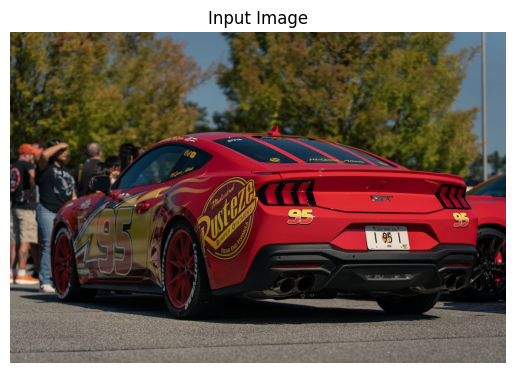

Predicted class: 817


In [27]:
vgg_test_image = Image.open(f"{path}/Images/Neural_Transfer/Car.jpeg")

#TODO: Plot the image which we are feeding to the model
plt.imshow(vgg_test_image)
plt.title("Input Image")
plt.axis('off')
plt.show()

preprocess_vgg = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
]) #TODO: required transformations for the input to the vgg model

#TODO: Predict the output of the vgg model for the test image (final classifier output and also each feature map output (in Conv2D layers))
input_tensor = preprocess_vgg(vgg_test_image)
input_batch = input_tensor.unsqueeze(0)

vgg_model = models.vgg19(weights=VGG19_Weights.IMAGENET1K_V1).to(device)
vgg_model.eval()
with torch.no_grad():
    output = vgg_model(input_batch.to(device))
_, predicted_class = torch.max(output, 1)
print(f"Predicted class: {predicted_class.item()}")


As you can see, the output of the classifier is an integer. This integer is actually the **class number** in _Image Net_ dataset. Let's get the name of the class:

In [28]:
import requests

class_idx = requests.get(
    "https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json"
).json()

# Get the class name
class_name = class_idx[predicted_class.item()]

print(f"Predicted class: {class_name}")

Predicted class: sports car


Now that we understood the architecture of VGG, and also the output of its classifier, it's time to extract features from the images! And see what's going on in the feature maps!

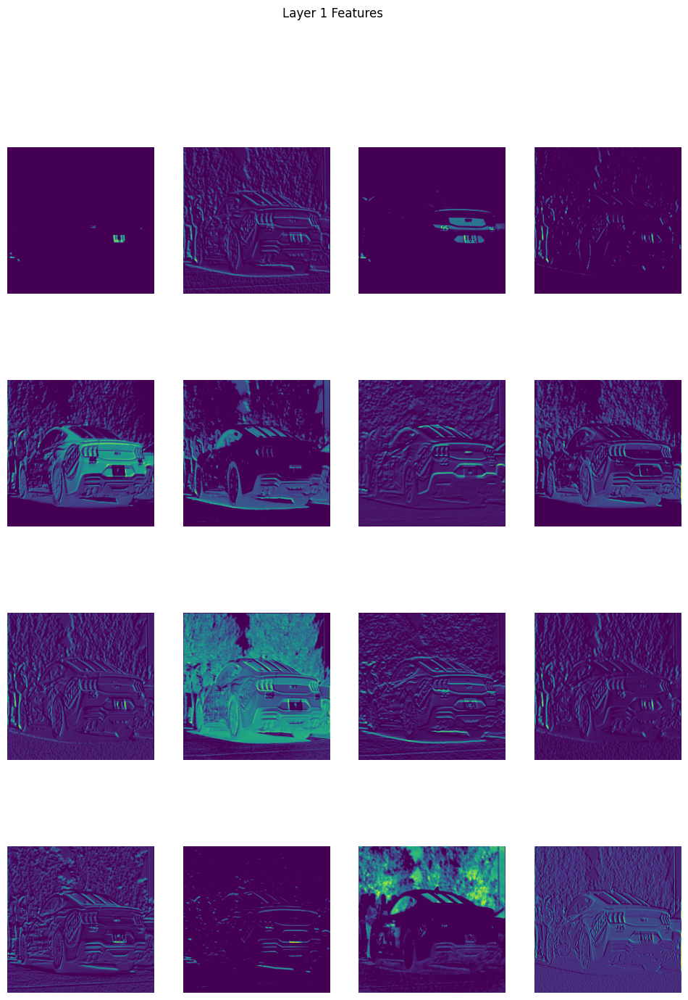

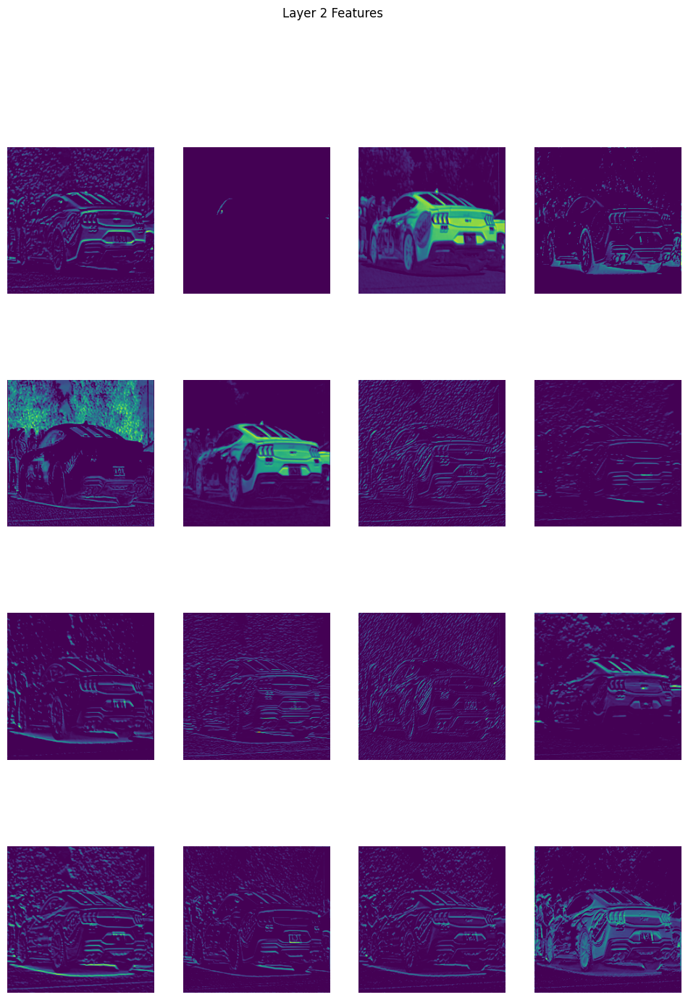

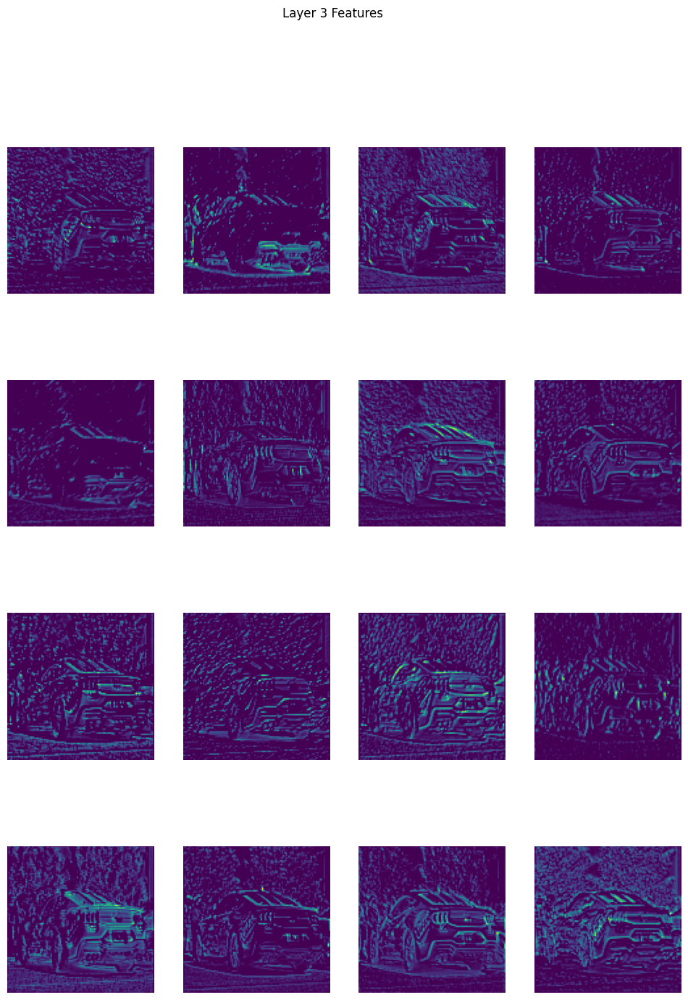

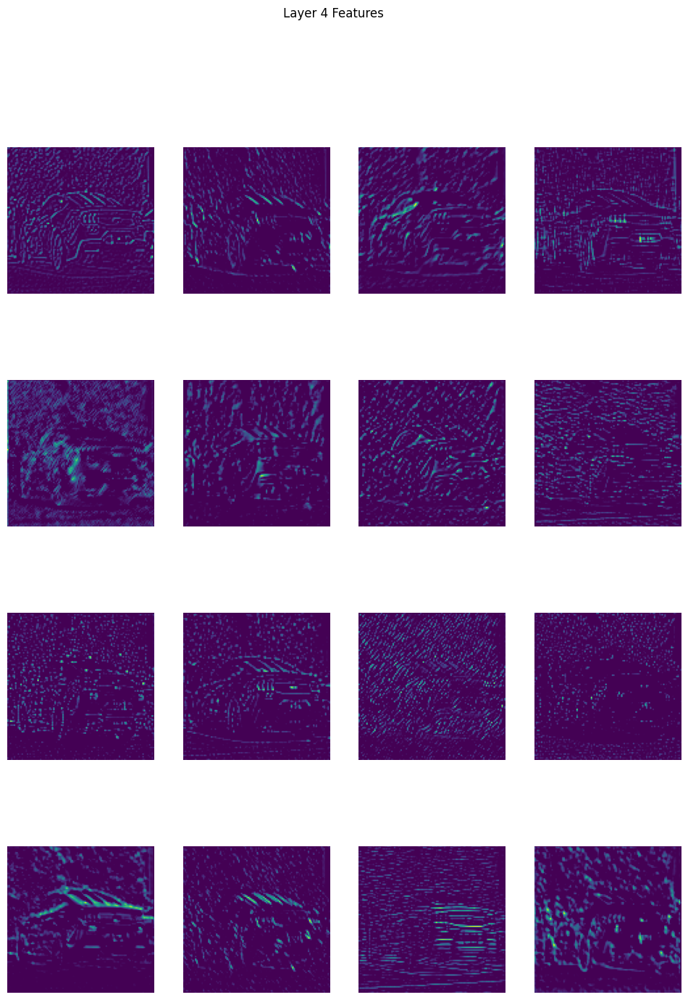

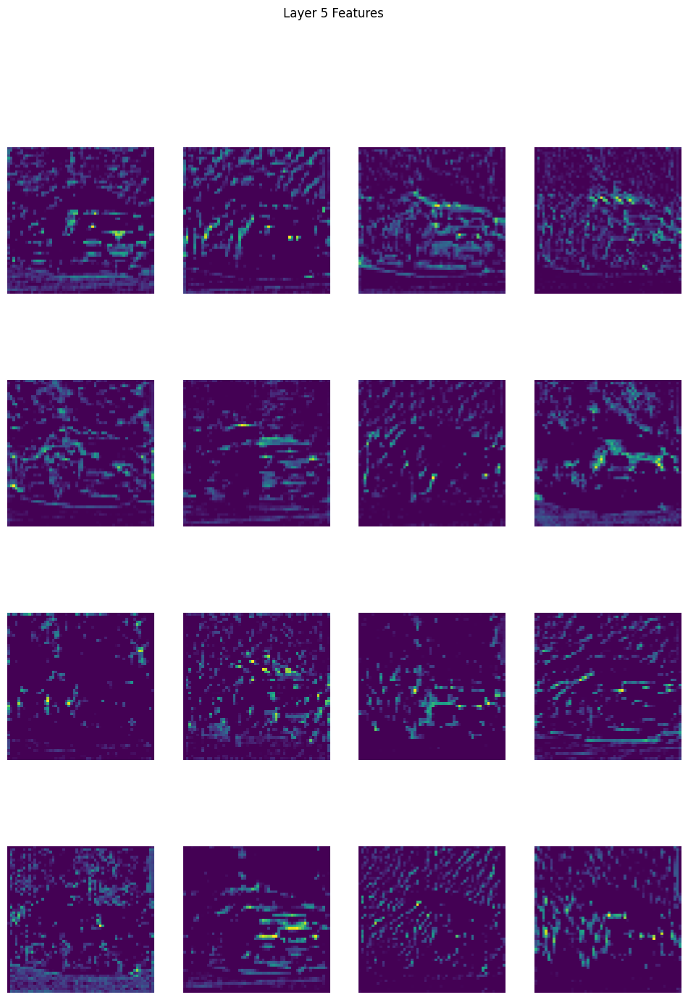

...

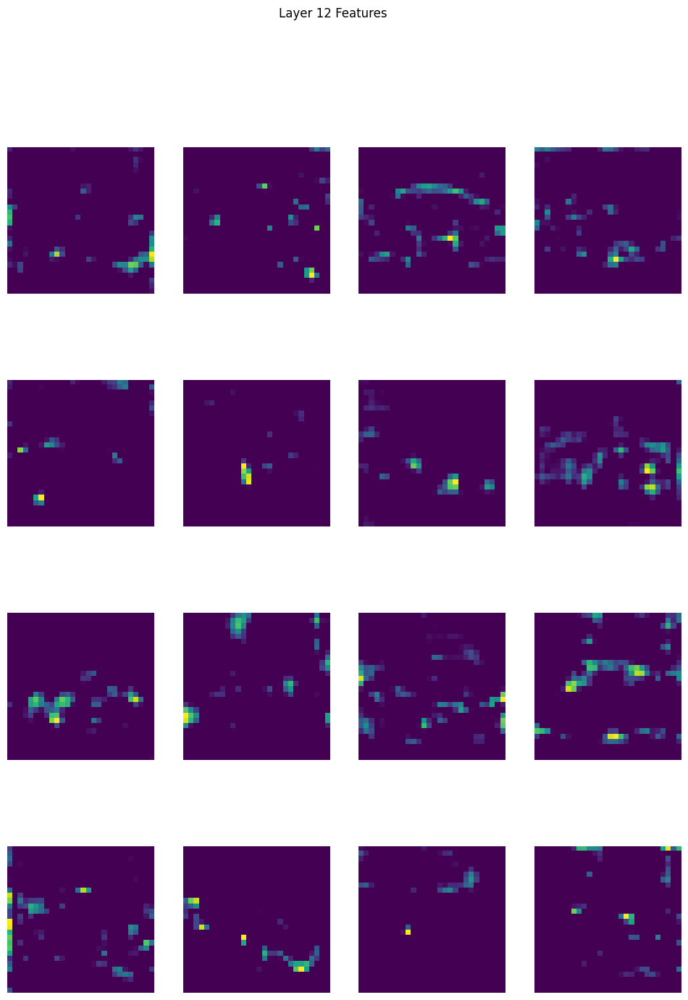

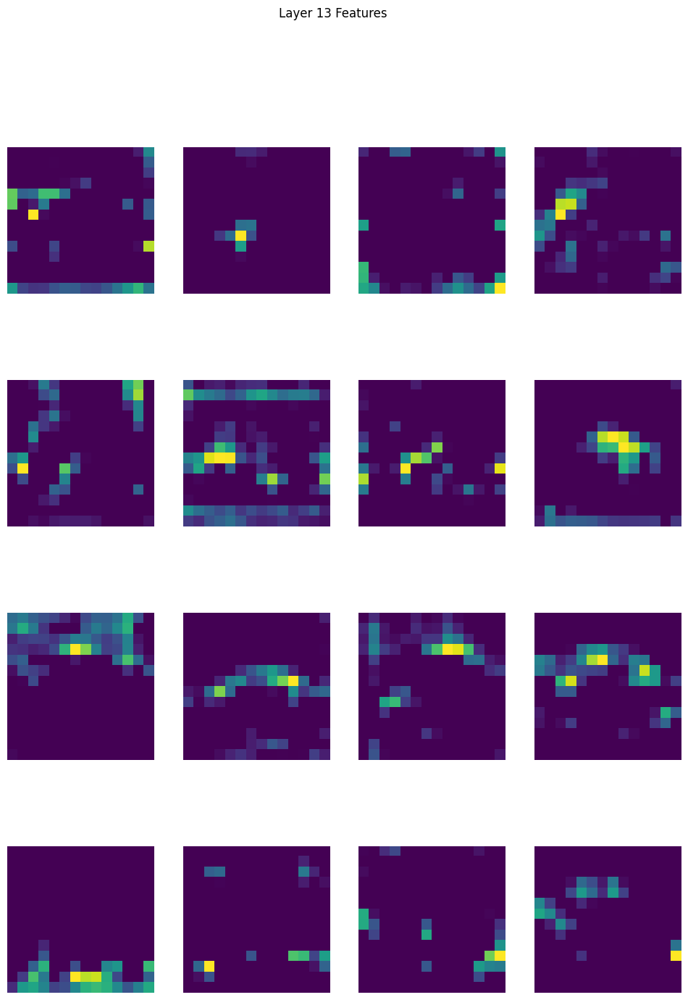

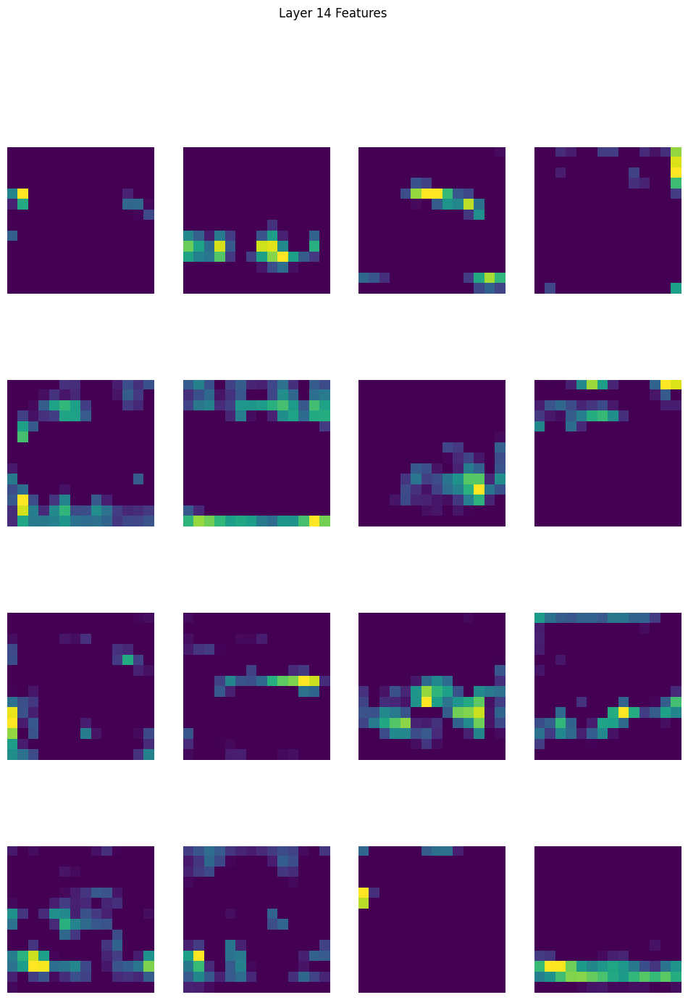

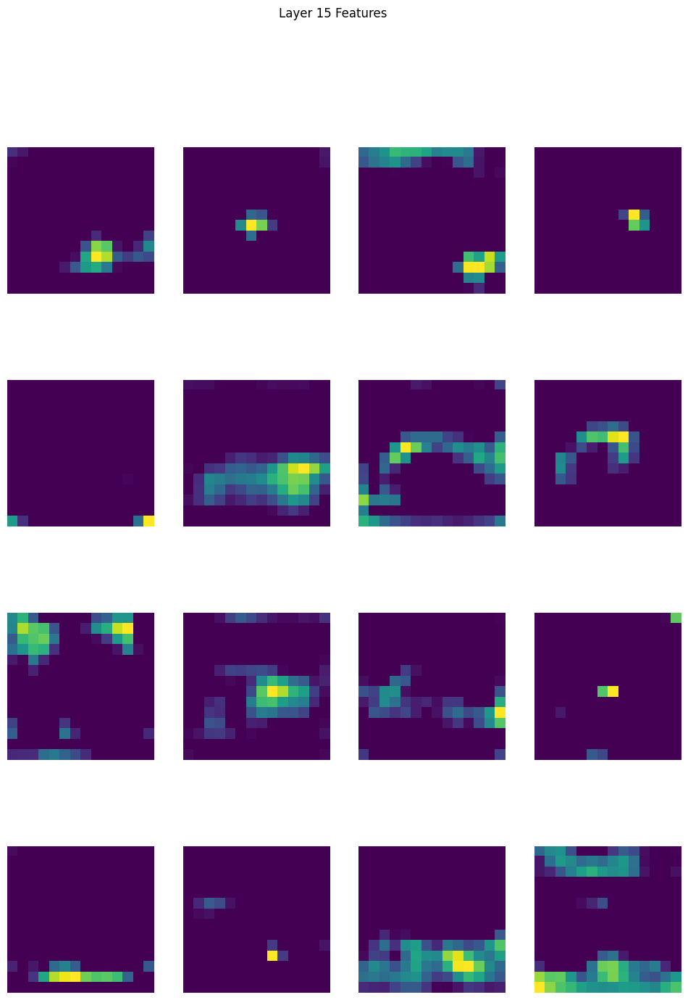

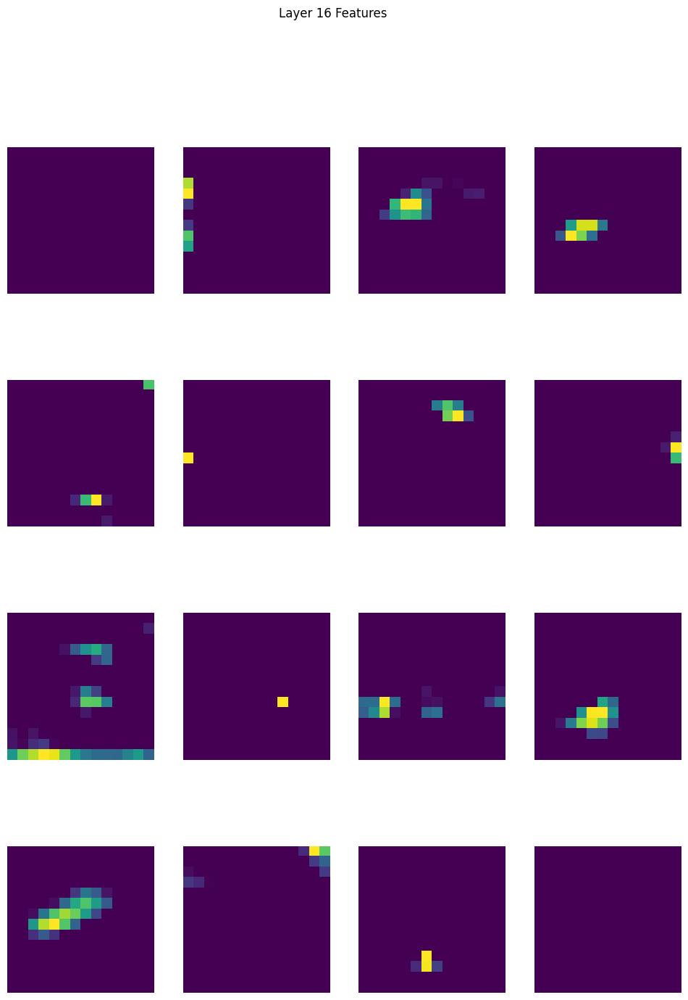

In [29]:
# Visualize the first 16 feature maps of each Conv2D layer (there are 16 Conv2D layers in VGG19)
#TODO
feature_maps = []

def hook_fn(module, input, output):
    feature_maps.append(output)

# Register hooks to all convolutional layers
hooks = []
for layer in vgg_model.features:
    if isinstance(layer, torch.nn.Conv2d):
        hooks.append(layer.register_forward_hook(hook_fn))

# Forward pass to get the feature maps
with torch.no_grad():
    _ = vgg_model(input_batch.to(device))

# Remove the hooks
for hook in hooks:
    hook.remove()

# Visualize some of the feature maps
def visualize_feature_maps(feature_maps, num_cols=4):
    num_layers = len(feature_maps)
    num_images = feature_maps[0].shape[1]

    for i in range(num_layers):
        fig, axes = plt.subplots(num_cols, num_cols, figsize=(12, 16))
        fig.suptitle(f"Layer {i + 1} Features")
        for j in range(num_layers):
            axes[j // 4, j % 4].imshow(feature_maps[i][0, j].cpu())
            axes[j // 4, j % 4].axis('off')
        # plt.title()
        plt.show()

# Visualize the first few feature maps
visualize_feature_maps(feature_maps[:16])

It's fun too look under the hood, isn't it? As you can see, we can guess what are the learned features in each layer if the network (at least in the first layers). For example, in the first layer, the network learns to detect edges, and in the second layer, it learns to detect simple shapes. In the deeper layers, the network learns to detect more complex features.

### 2.3 - Content and Style Loss (15/90 pts)

In order to learn the correct image and keep the content of the original image while applying the style of the seconf image, we need 2 losses: 1. Content Loss and 2. Style Loss. Let's delve into each one!

**Content Loss** is responsible for keeping the content of the original image. It is calculated as the mean squared error between the feature maps of the original image and the generated image.

In [30]:
class ContentLoss(nn.Module):
    def __init__(self, target):
        super(ContentLoss, self).__init__()
        self.target = target.detach() #TODO

    def forward(self, input):
        #TODO
        self.loss = F.mse_loss(input, self.target)
        return input

In [31]:
target_feature_map = torch.rand((1, 512, 28, 28)).to(device)
content_loss_layer = ContentLoss(target_feature_map)
input_feature_map = torch.rand((1, 512, 28, 28)).to(device)

loss_value = content_loss_layer(input_feature_map)
print(f"Content Loss: {content_loss_layer.loss.item()}")

Content Loss: 0.16619110107421875


**Style Loss** is responsible for applying the style of the second image to the generated image. It is calculated as the mean squared error between the Gram matrices of the feature maps of the second image and the generated image.

In [32]:
def gram_calculator(input):
    """
    Calculate the normalized Gram Matrix of a given input
    """
    b, c, h, w = input.size()
    features = input.view(b * c, h * w)
    gram_matrix = torch.mm(features, features.t())
    gram_matrix /= (b * c * h * w)
    return gram_matrix

In [33]:
class StyleLoss(nn.Module):
    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_calculator(target_feature).detach()  # TODO

    def forward(self, input):
        G = gram_calculator(input)
        self.loss = F.mse_loss(G, self.target)
        return input

Now, we use `features` part of the VGG model to extract features from the content and style images. Then, we calculate the content and style loss using the extracted features.

In [34]:
cnn = models.vgg19(weights=VGG19_Weights.IMAGENET1K_V1).features.to(device).eval() #TODO: Get the `features` part of the VGG19 model

In [35]:
cnn_normalization_mean = torch.tensor(
    [0.485, 0.456, 0.406]
)  # Normalization mean for the VGG19 model
cnn_normalization_std = torch.tensor(
    [0.229, 0.224, 0.225]
)  # Normalization std for the VGG19 model


# Normalize the images in order to feed it to the VGG19 model
# ...
normalization_transform = transforms.Normalize(mean=cnn_normalization_mean, std=cnn_normalization_std)
def preprocess_and_normalize(image):
    preprocess = transforms.Compose([
        transforms.Resize(img_size),
        transforms.ToTensor(),
        normalization_transform
    ])
    return preprocess(image).unsqueeze(0)

# content_image = Image.open(f"{path}/Images/Neural_Transfer/Car.jpeg")
# style_image = Image.open(f"{path}/Images/Neural_Transfer/Style.jpeg")

content_image_nor = preprocess_and_normalize(Image.open(f"{path}/Images/Neural_Transfer/Content.jpeg")).to(device)
style_image_nor = preprocess_and_normalize(Image.open(f"{path}/Images/Neural_Transfer/style.jpeg")).to(device)

print("Content image shape:", content_image_nor.shape)
print("Style image shape:", style_image_nor.shape)

Content image shape: torch.Size([1, 3, 512, 512])
Style image shape: torch.Size([1, 3, 512, 646])


Please note that after which layers you should calculate the content loss and after which ones, you should calculate the style loss. Use the layer names you saw earlier in the `torchsummary` output for VGG19 model.

In [36]:
content_layers_default = ['conv_4'] # TODO
style_layers_default = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5'] # TODO

#TODO: any processes you want to add and/or helper functions

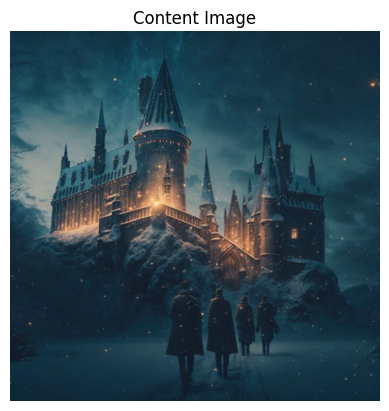

In [37]:
# Plot the input image to the model
# TODO
plt.imshow(content_image.cpu().squeeze(0).permute(1, 2, 0))
plt.title("Content Image")
plt.axis('off')
plt.show()

(15/90 pts) Now, we need to define our optimizer. We use `LBFGS` optimizer. Let's get familiar with this optimizer a little bit:

Let's use this optimizer to optimize a simple function $f(x) = x^2$. We want to find the minimum of this function using `LBFGS` optimizer. First, you should initialize a tensor $x$ with a random value. Then, you should define a closure function that calculates the value of the function and its gradient. Finally, you should use the `step` method of the optimizer to update the value of $x$.

And lastly, you should generate an animation using `matplotlib.animation` to show how the value of $x$ changes during optimization.

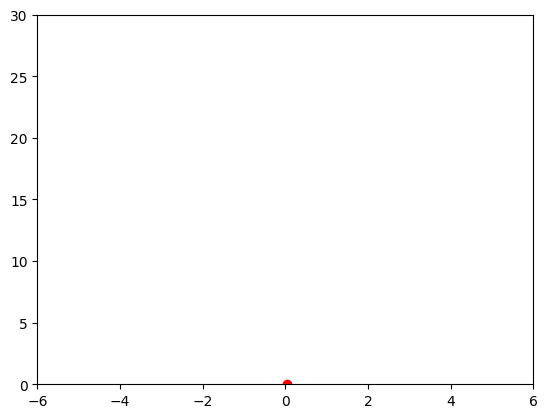

In [48]:
import torch
import torch.optim as optim
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import display, HTML

def func(x):
    return x ** 2

x = torch.tensor([5.0], requires_grad=True)

optimizer = optim.LBFGS([x], lr=0.05, max_iter=20)

x_values = []

def closure():
    optimizer.zero_grad()
    loss = func(x)
    loss.backward()
    x_values.append(x.item())
    return loss

for _ in range(20):
    optimizer.step(closure)

fig, ax = plt.subplots()
line, = ax.plot([], [], 'ro-')

ax.set_xlim(-6, 6)
ax.set_ylim(0, 30)

def init():
    line.set_data([], [])
    return line,

def update(frame):
    line.set_data([x_values[frame]], [x_values[frame] ** 2])
    return line,

ani = animation.FuncAnimation(fig, update, frames=len(x_values), init_func=init, blit=True)


HTML(ani.to_jshtml())


(35/90 pts) Now, let's use this optimizer to optimize our `input_image` to minimize the content and style loss. You should define a closure function that calculates the content and style loss and their gradients. Then, you should use the `step` method of the optimizer to update the value of the `input_image`. Please also **note** that you should use a weighted sum of the content and style loss to optimize the input image. (weight of each loss is a hyperparameter)

Starting Style Transfer...
iteration 0:
Style Loss : 12555.620117 Content Loss: 0.000000



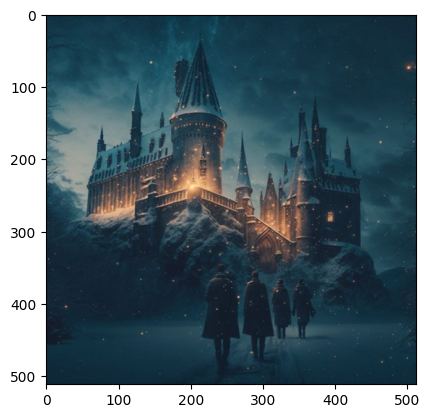

iteration 50:
Style Loss : 34.006176 Content Loss: 26.711502



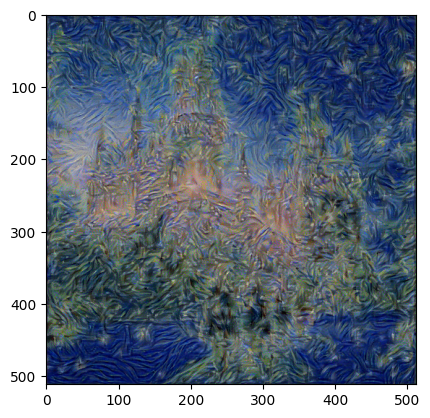

iteration 100:
Style Loss : 8.050552 Content Loss: 23.461161



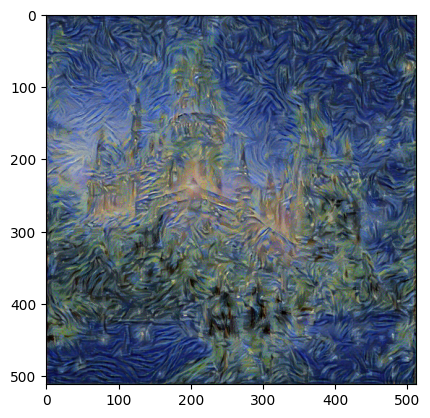

iteration 150:
Style Loss : 4.317760 Content Loss: 20.100792



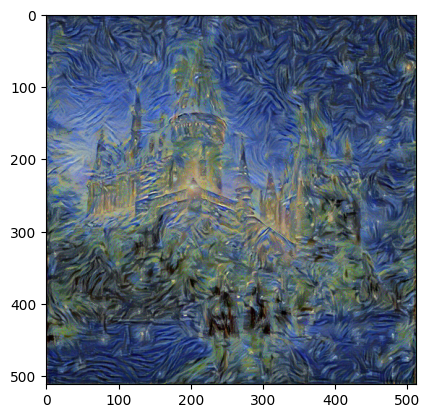

iteration 200:
Style Loss : 3.026343 Content Loss: 17.799238



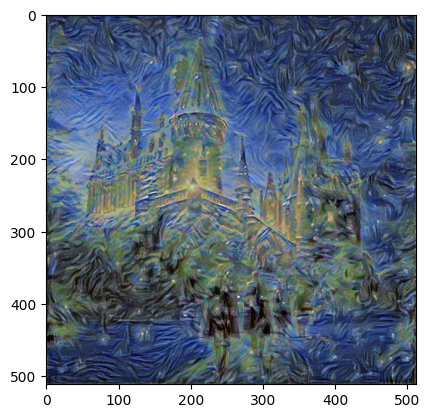

iteration 250:
Style Loss : 2.375697 Content Loss: 16.186321



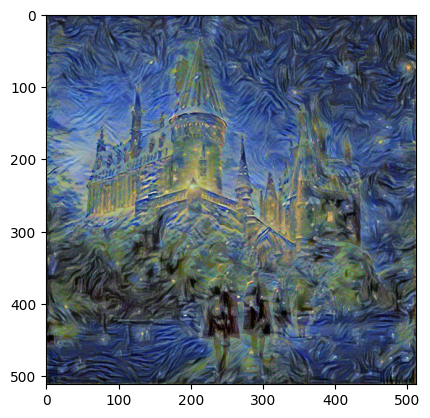

iteration 300:
Style Loss : 1.860108 Content Loss: 14.911614



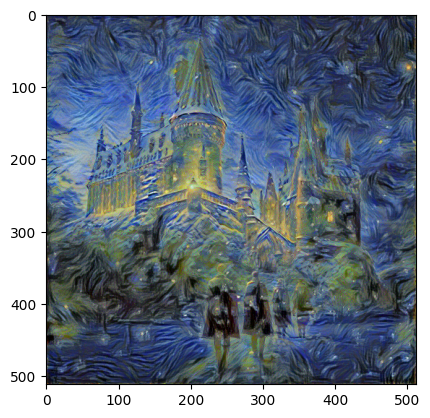

iteration 350:
Style Loss : 1.450372 Content Loss: 13.947536



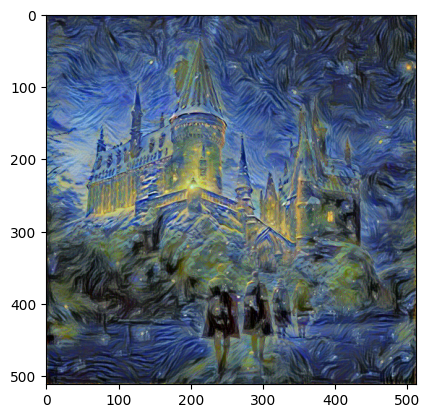

iteration 400:
Style Loss : 1.200714 Content Loss: 13.183853



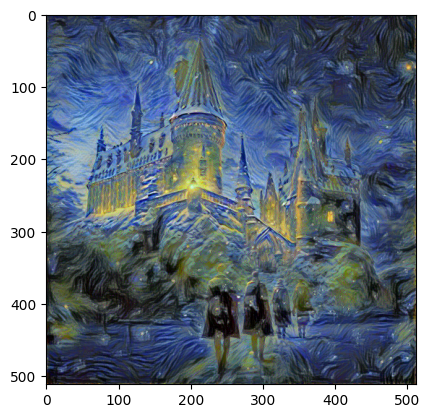

iteration 450:
Style Loss : 0.953182 Content Loss: 12.631367



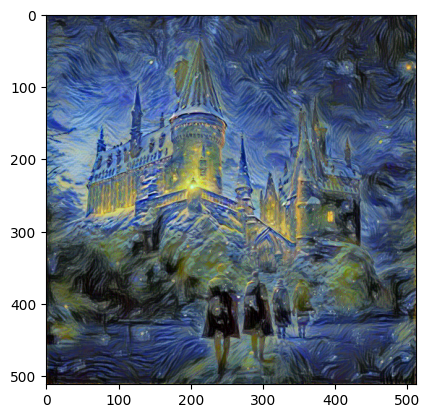

iteration 500:
Style Loss : 0.830278 Content Loss: 12.180174



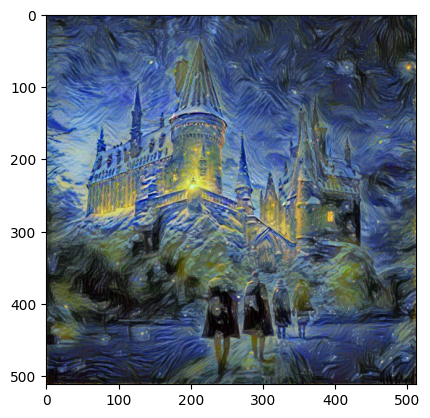

iteration 550:
Style Loss : 0.753408 Content Loss: 11.824405



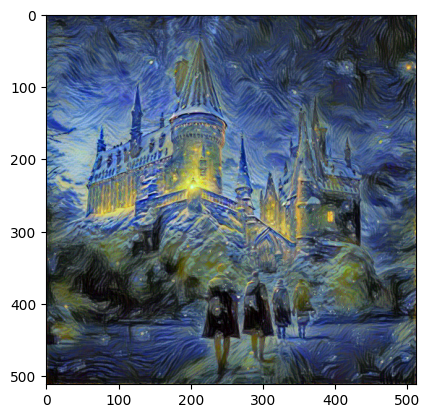

iteration 600:
Style Loss : 0.706801 Content Loss: 11.553879



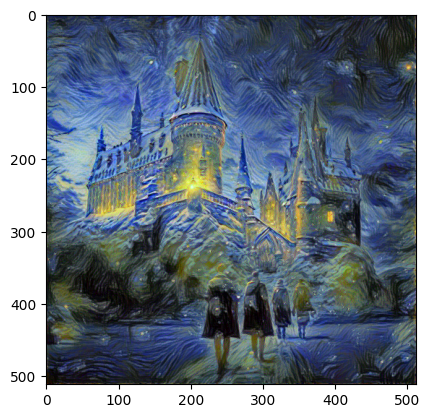

iteration 650:
Style Loss : 0.673495 Content Loss: 11.342100



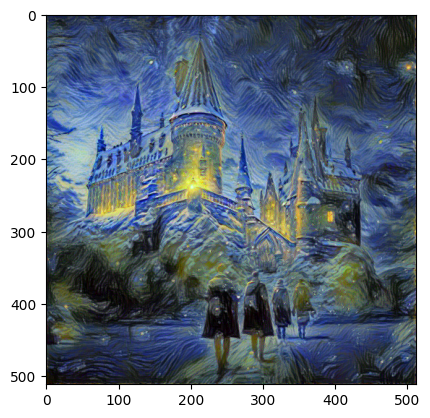

iteration 700:
Style Loss : 0.642087 Content Loss: 11.179504



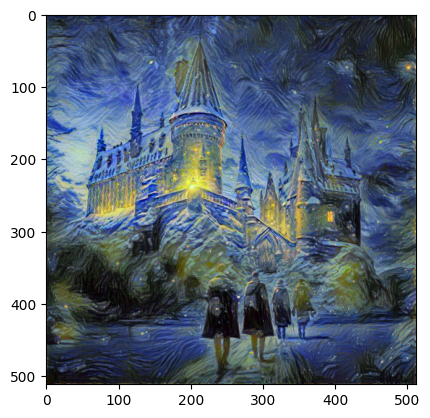

iteration 750:
Style Loss : 0.619701 Content Loss: 11.040861



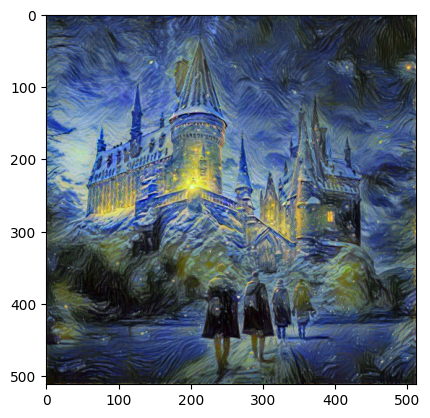

iteration 800:
Style Loss : 0.598490 Content Loss: 10.927096



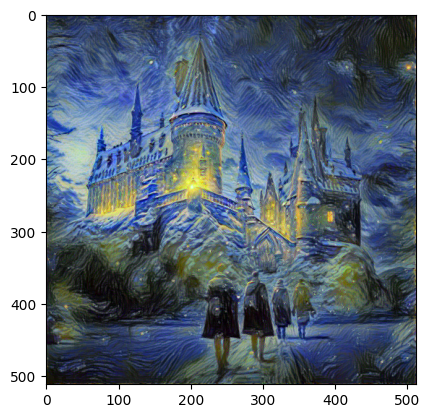

iteration 850:
Style Loss : 0.579304 Content Loss: 10.830326



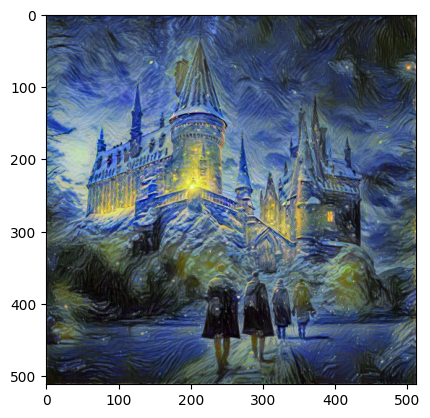

iteration 900:
Style Loss : 0.561985 Content Loss: 10.750055



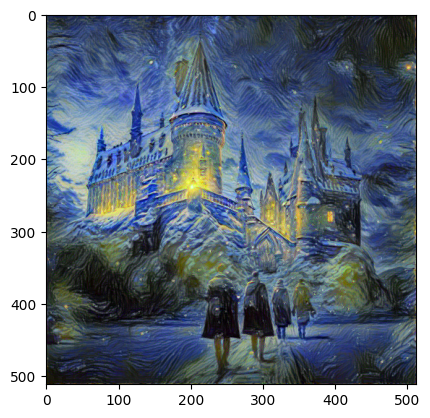

iteration 950:
Style Loss : 0.550000 Content Loss: 10.681118



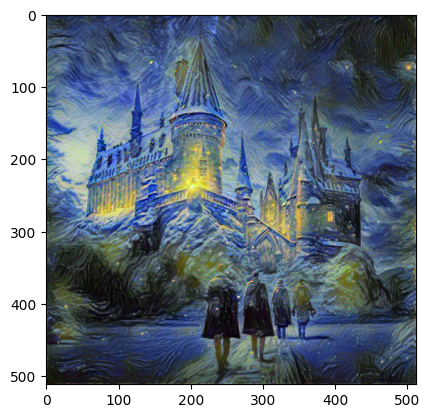

iteration 1000:
Style Loss : 0.539279 Content Loss: 10.618515



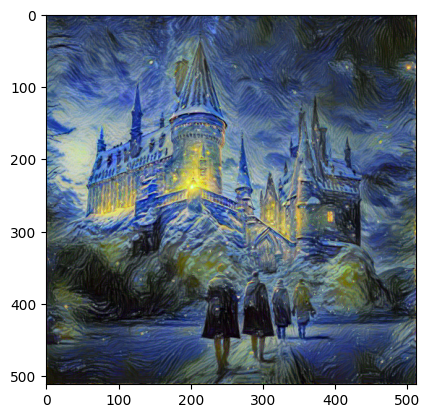

In [64]:
# Train your model using LBFGS optimizer and 2 implemented losses (style loss and content loss)
# You should report the `style loss`, `content loss`, and `total loss` for each iteration. Note that `total loss`
# is the sum of `style loss` and `content loss` with some weights (alpha and beta) which you should tune them.
# Also, please plot the image each 50 iterations.
# An important note is that your optimizer might change the values of the image tensor in a way that the pixel values
# are no longer in the range of [0, 1] (in normalized format). So, you should clip the values of the image tensor
# to be in the range of [0, 1] after each iteration, to prevent any problems occuring to your image.
# TODO

class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        self.mean = mean.clone().view(-1, 1, 1)
        self.std = std.clone().view(-1, 1, 1)

    def forward(self, img):
        return (img - self.mean) / self.std

def get_style_model_and_losses(cnn, normalization_mean, normalization_std, style_img, content_img,
                               content_layers=content_layers_default, style_layers=style_layers_default):
    normalization = Normalization(normalization_mean, normalization_std).to(device)
    model = nn.Sequential(normalization)

    content_losses = []
    style_losses = []

    i = 0
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        if name in content_layers:
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)

    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]

    return model, style_losses, content_losses


style_scores = []
content_scores = []
total_scores = []

def run_style_transfer(cnn, normalization_mean, normalization_std, content_img, style_img, input_img, num_steps=1000,
                       style_weight=1000000, content_weight=1):
    model, style_losses, content_losses = get_style_model_and_losses(
        cnn, normalization_mean,
        normalization_std,
        style_img, content_img
    )

    optimizer = optim.LBFGS([input_img])

    print('Starting Style Transfer...')
    iterations = [0]
    while iterations[0] <= num_steps:

        def closure():
            input_img.data.clamp_(0, 1)
            optimizer.zero_grad()
            model(input_img)
            style_score = torch.tensor(0.0, device=device)
            content_score = torch.tensor(0.0, device=device)

            for sl in style_losses:
                style_score += sl.loss
            for cl in content_losses:
                content_score += cl.loss

            style_score *= style_weight
            content_score *= content_weight
            loss = style_score + content_score
            loss.backward()

            style_scores.append(style_score.item())
            content_scores.append(content_score.item())
            total_scores.append(loss.item())

            if iterations[0] % 50 == 0:
                print("iteration {}:".format(iterations[0]))
                print('Style Loss : {:4f} Content Loss: {:4f}'.format(style_score.item(), content_score.item()))
                print()
                imshow(input_img)

            iterations[0] += 1
            return style_score + content_score

        optimizer.step(closure)

    input_img.data.clamp_(0, 1)
    return input_img


input_img = content_image.clone().requires_grad_(True)

output = run_style_transfer(
    cnn, cnn_normalization_mean,
    cnn_normalization_std, content_image,
    style_image, input_img
)


Now, let's see the result of optimization process on our `input_image`.

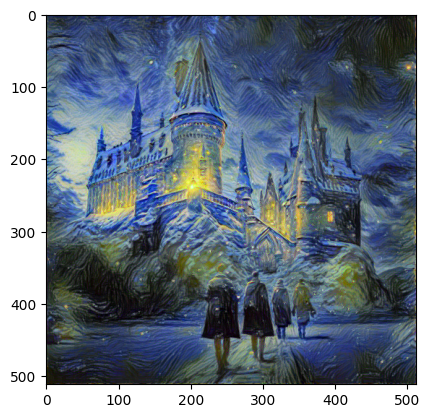

In [66]:
# TODO: Plot the final image
imshow(input_img)

(5/90 pts) Also, let's plot our `style_losses`, `content_losses` and `total_losses` to see how they change during the optimization process.

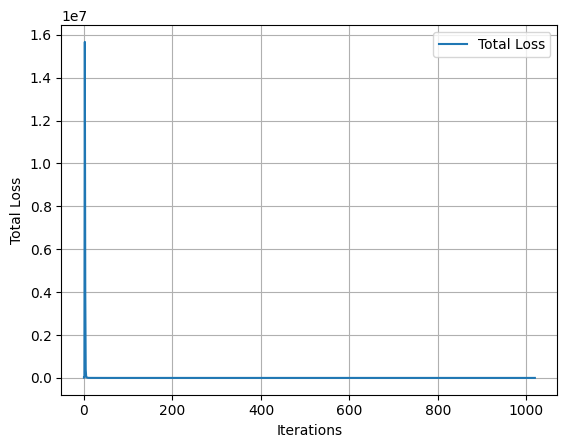

In [61]:
#TODO: Plot the total weighted loss w.r.t. the iteration number
plt.plot(total_scores, label='Total Loss')
plt.xlabel('Iterations')
plt.ylabel('Total Loss')
plt.legend()
plt.grid(True)

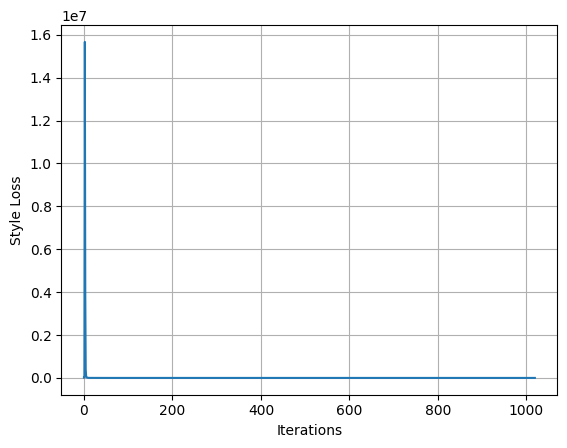

In [59]:
# TODO: Plot the style loss w.r.t. the iteration number
plt.plot(style_scores, label='Style Loss')
plt.xlabel('Iterations')
plt.ylabel('Style Loss')
plt.legend()
plt.grid(True)

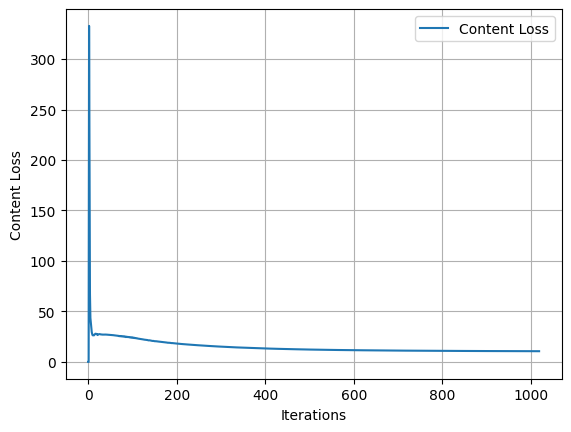

In [60]:
# TODO: Plot the content loss w.r.t. the iteration number
plt.plot(content_scores, label='Content Loss')
plt.xlabel('Iterations')
plt.ylabel('Content Loss')
plt.legend()
plt.grid(True)